In [6]:
import numpy as np
import sklearn.datasets
import matplotlib.pyplot as plt
from src.SpectralClustering import SpectralClustering
from sklearn.metrics.cluster import adjusted_rand_score

In [7]:
k_tests   = np.linspace(0, 300, 100, dtype=int)
eps_tests = np.linspace(0, 1, 30)

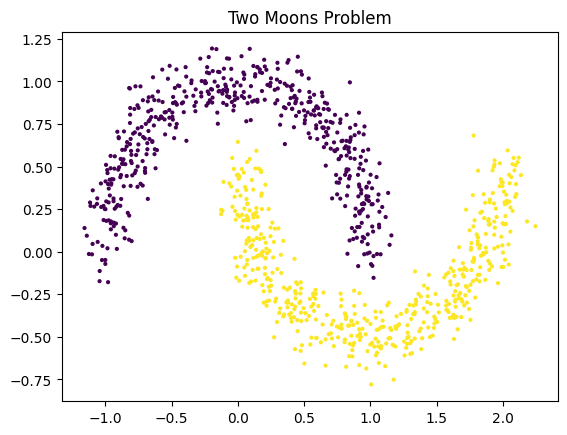

In [8]:
# generate the two moons problem

X, y_true = sklearn.datasets.make_moons(n_samples=1000, shuffle=False, noise=0.1, random_state=42)
plt.scatter(X[:,0], X[:,1], c=y_true, s=4)
plt.title('Two Moons Problem')
plt.show()

In [9]:
# helper method: quickly train model using config, get labels
def get_labels(refinement_method, eps = None, k = None):
    spec_model = SpectralClustering(2, refinement=refinement_method, k = k, eps = eps)
    spec_model.fit(X)
    y_pred = spec_model.labels_
    return y_pred

In [11]:
# calculate predictions for each of k and eps tests
knn_predictions  = [get_labels('knn'       , k = k    ) for k   in k_tests  ]
mknn_predictions = [get_labels('mutual_knn', k = k    ) for k   in k_tests  ]
eps_predictions  = [get_labels('eps'       , eps = eps) for eps in eps_tests]

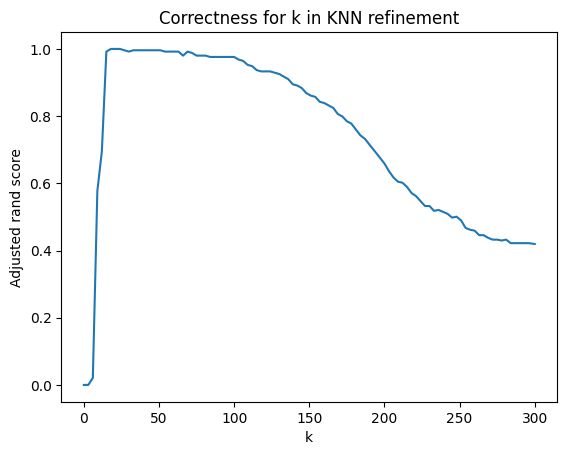

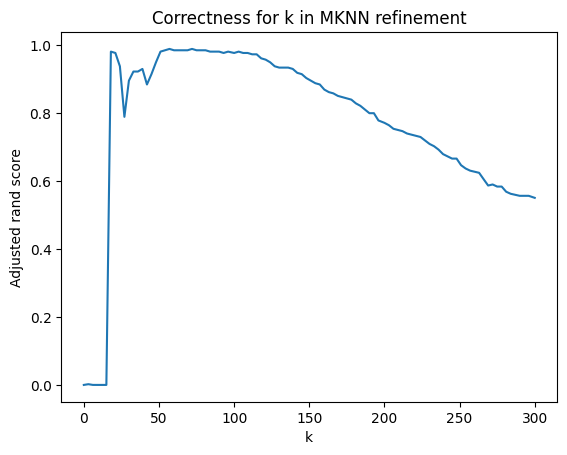

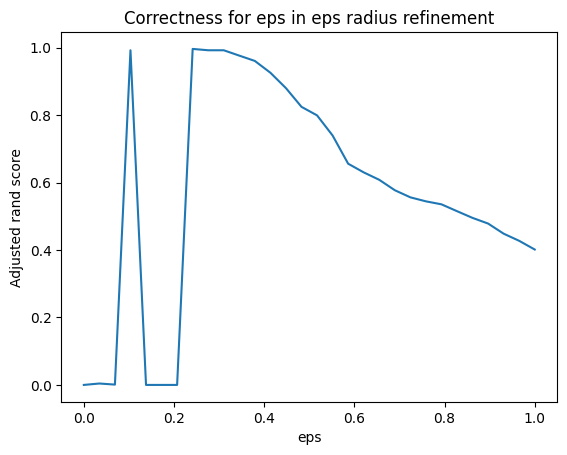

In [12]:
# generate scores and show as graph
knn_scores  = [adjusted_rand_score(y_true, y_pred) for y_pred in knn_predictions ]
mknn_scores = [adjusted_rand_score(y_true, y_pred) for y_pred in mknn_predictions]
eps_scores  = [adjusted_rand_score(y_true, y_pred) for y_pred in eps_predictions ]

plt.title('Correctness for k in KNN refinement')
plt.xlabel('k')
plt.ylabel('Adjusted rand score')
plt.plot(k_tests, knn_scores)
plt.show()

plt.title('Correctness for k in MKNN refinement')
plt.xlabel('k')
plt.ylabel('Adjusted rand score')
plt.plot(k_tests, mknn_scores)
plt.show()

plt.title('Correctness for eps in eps radius refinement')
plt.xlabel('eps')
plt.ylabel('Adjusted rand score')
plt.plot(eps_tests, eps_scores)

plt.show()

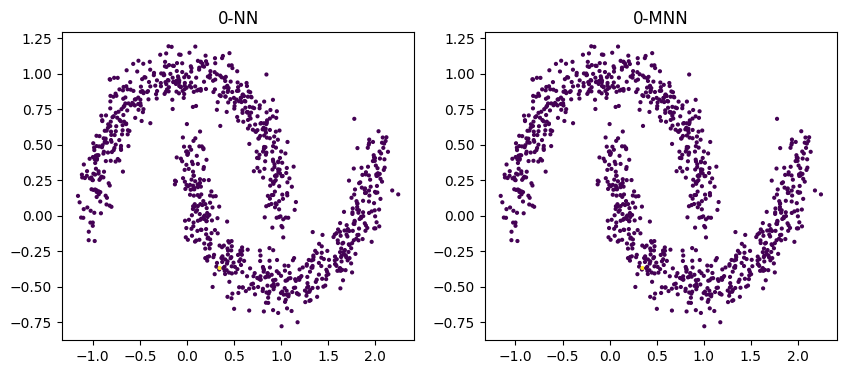

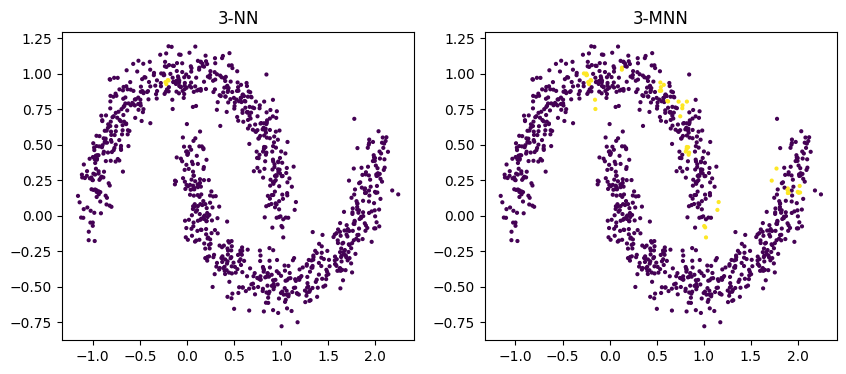

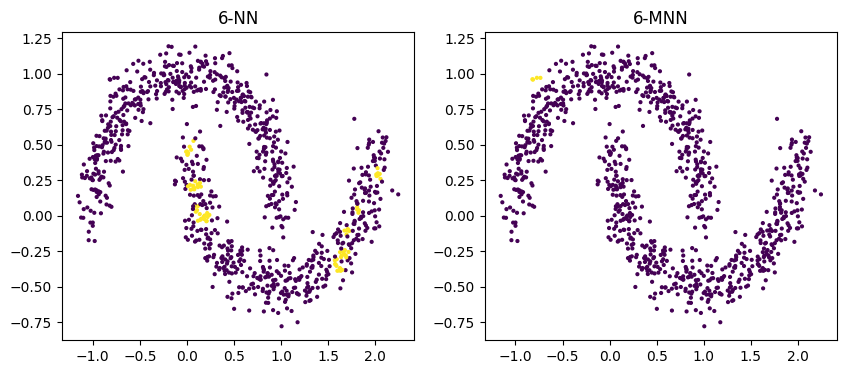

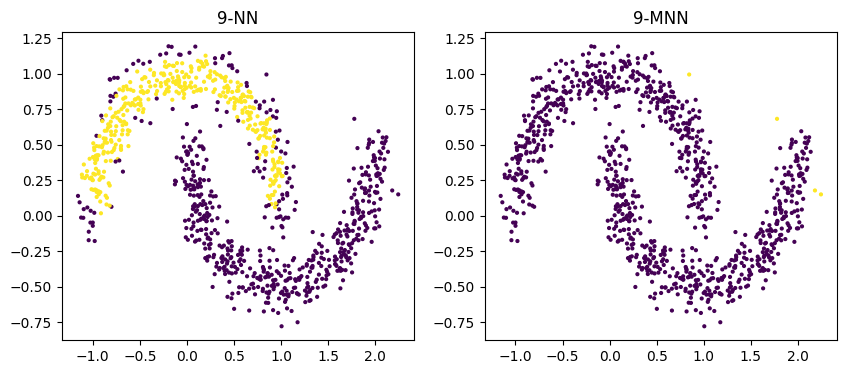

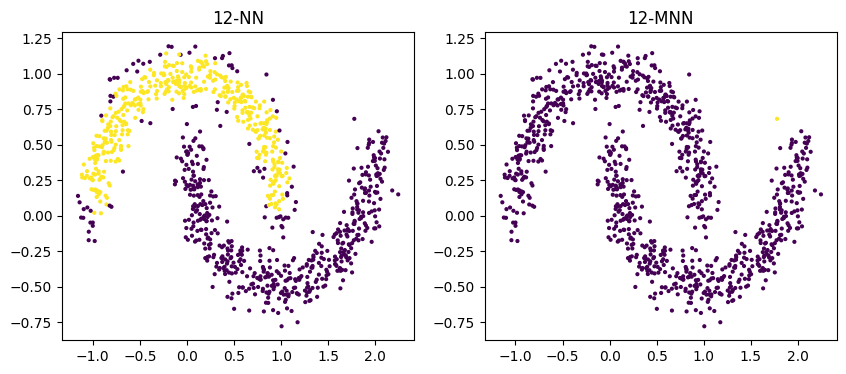

...

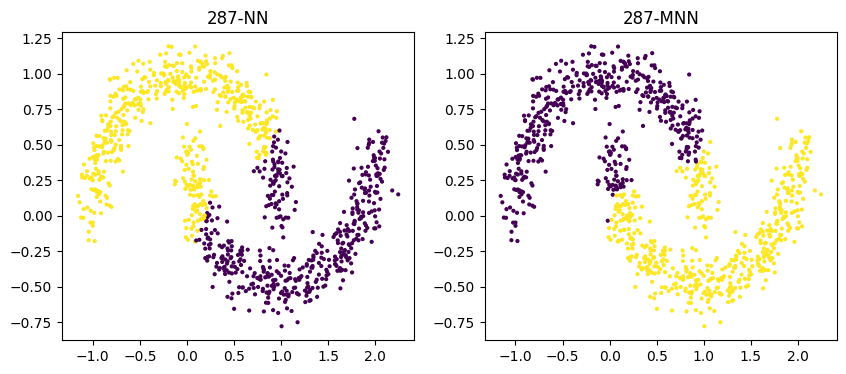

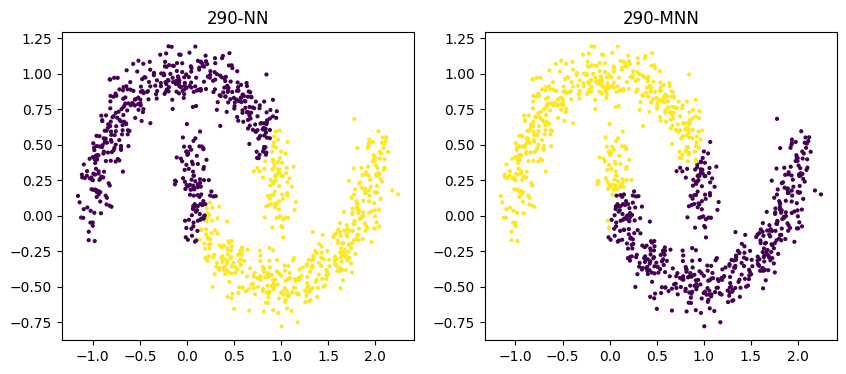

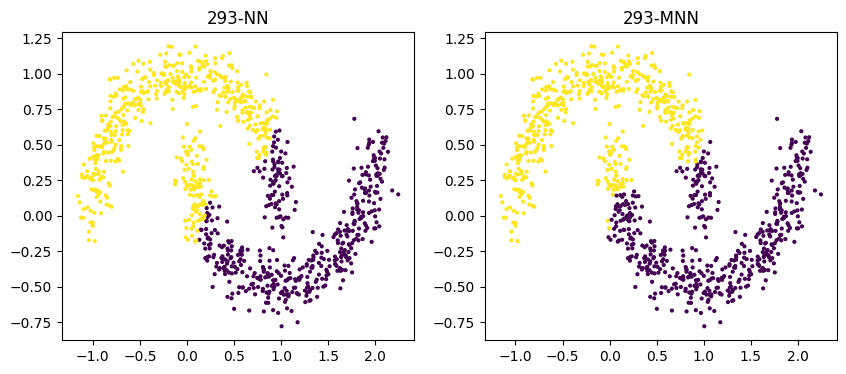

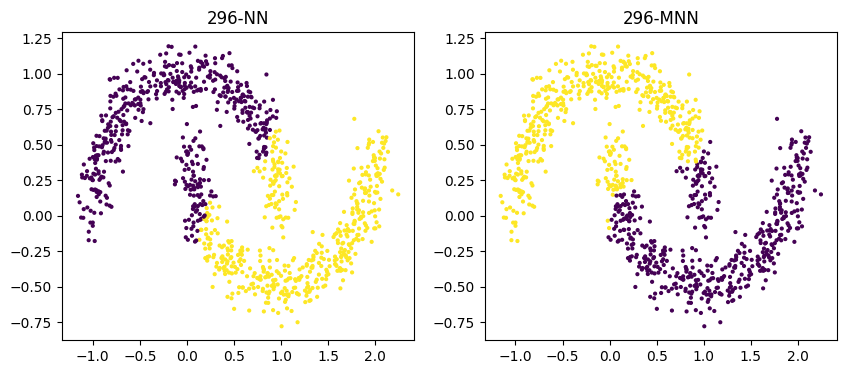

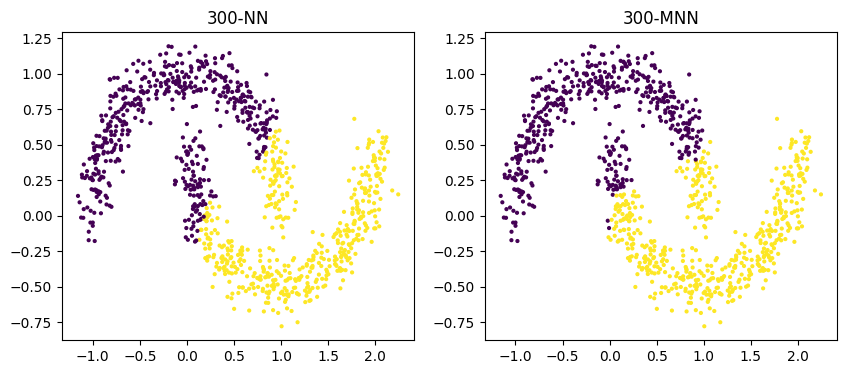

In [13]:
# show graphs for all knn and mknn predictions

for i, k in enumerate(k_tests):
    plt.figure(figsize=(10, 4))

    y_pred = knn_predictions[i]
    plt.subplot(1, 2, 1)
    plt.scatter(X[:,0], X[:,1], c=y_pred, s=4)
    plt.title(f'{k}-NN')

    y_pred = mknn_predictions[i]
    plt.subplot(1, 2, 2)
    plt.scatter(X[:,0], X[:,1], c=y_pred, s=4)
    plt.title(f'{k}-MNN')

    plt.show()

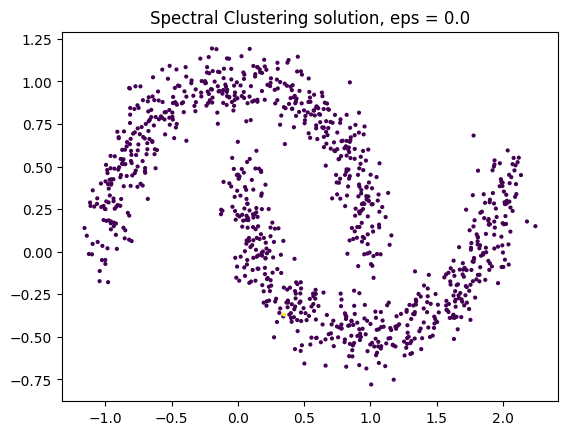

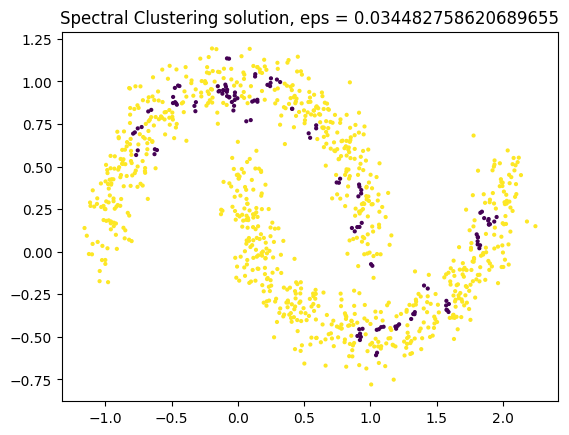

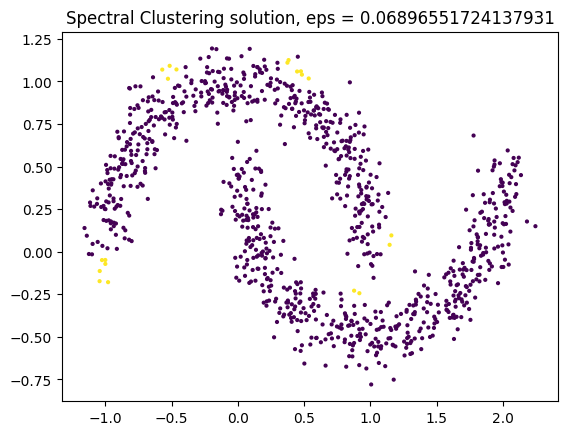

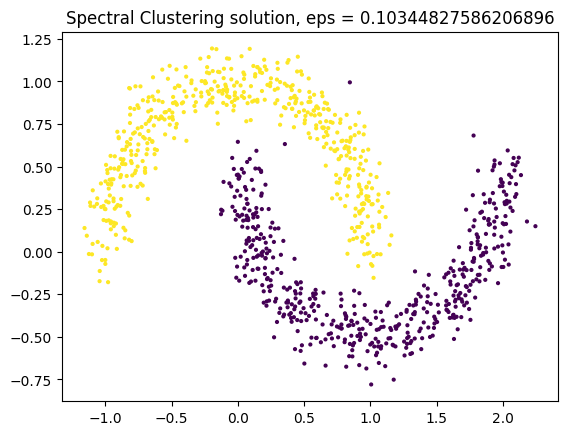

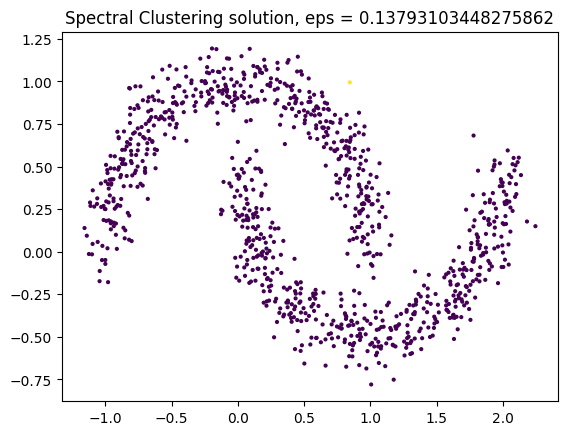

...

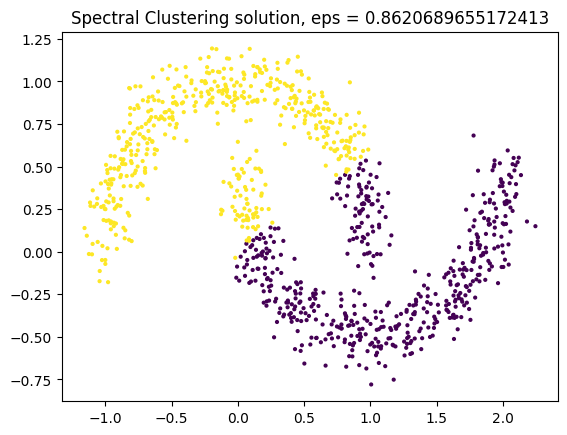

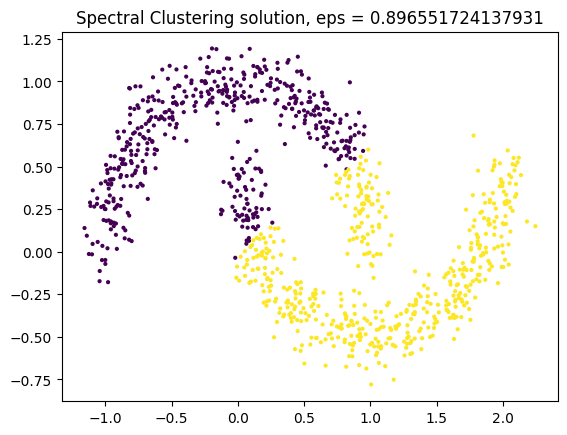

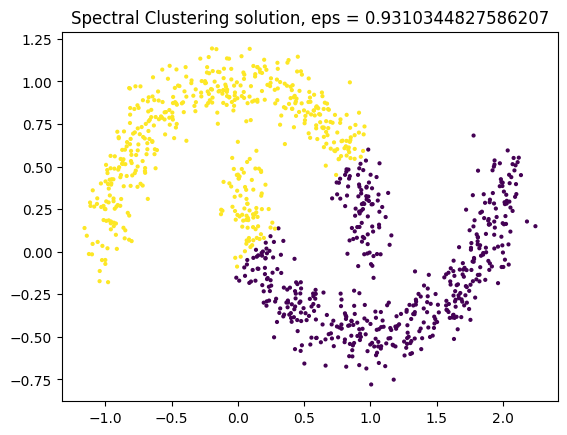

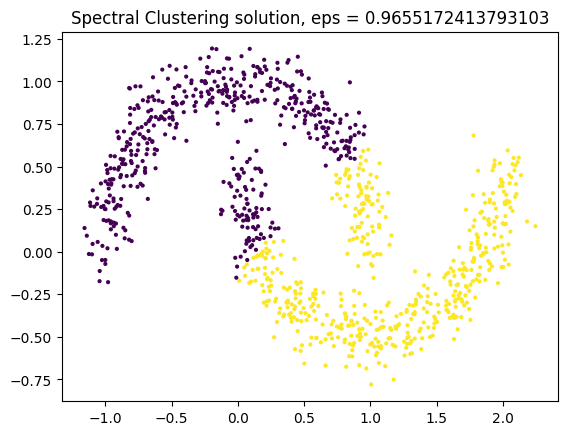

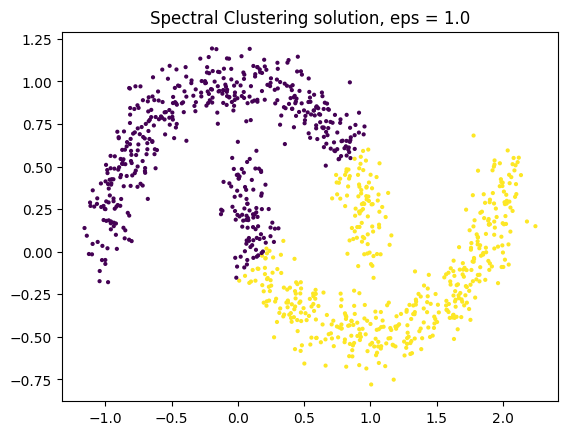

In [14]:
# show graphs for all eps predictions

for i, y_pred in enumerate(eps_predictions):
    eps = eps_tests[i]
    plt.scatter(X[:,0], X[:,1], c=y_pred, s=4)
    plt.title(f'Spectral Clustering solution, eps = {eps}')
    plt.show()